In [ ]:
!pip install lazypredict

In [ ]:
!pip install streamlit

In [ ]:
!pip install shap

In [ ]:
!pip install lime


In [124]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score
from sklearn.cluster import KMeans
import plotly.express as px
import plotly.graph_objects as go
import xgboost as xgb

import shap
import lime.lime_tabular


import streamlit as st
import lightgbm as lgb # Import LightGBM
from lightgbm import LGBMClassifier
import warnings
warnings.filterwarnings('ignore')


In [ ]:
df = pd.read_csv("/content/sample_data/Viral_Social_Media_Trends.csv")

df.columns = df.columns.str.strip().str.replace(" ", "_")



print(df.shape)
print(df.columns)
df.head()

(5000, 10)
Index(['Post_ID', 'Platform', 'Hashtag', 'Content_Type', 'Region', 'Views',
       'Likes', 'Shares', 'Comments', 'Engagement_Level'],
      dtype='object')


,Post_ID,Platform,Hashtag,Content_Type,Region,Views,Likes,Shares,Comments,Engagement_Level
0,Post_1,TikTok,#Challenge,Video,UK,4163464,339431,53135,19346,High
1,Post_2,Instagram,#Education,Shorts,India,4155940,215240,65860,27239,Medium
2,Post_3,Twitter,#Challenge,Video,Brazil,3666211,327143,39423,36223,Medium
3,Post_4,YouTube,#Education,Shorts,Australia,917951,127125,11687,36806,Low
4,Post_5,TikTok,#Dance,Post,Brazil,64866,171361,69581,6376,Medium


In [127]:
df.Engagement_Level.value_counts()

,count
Engagement_Level,
High,1598
Low,1598
Medium,1598


df.Engagement_Level.value_counts()

In [126]:
df = df.drop(['Post_ID'], axis=1, errors='ignore')
#df = df.drop(columns=['Post_ID'], errors='ignore')

In [ ]:
print(f"Forma del dataset: {df.shape}")
print(f"Columnas: {list(df.columns)}")
print(df.info())

Forma del dataset: (5000, 9)
Columnas: ['Platform', 'Hashtag', 'Content_Type', 'Region', 'Views', 'Likes', 'Shares', 'Comments', 'Engagement_Level']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Platform          5000 non-null   object
 1   Hashtag           5000 non-null   object
 2   Content_Type      5000 non-null   object
 3   Region            5000 non-null   object
 4   Views             5000 non-null   int64 
 5   Likes             5000 non-null   int64 
 6   Shares            5000 non-null   int64 
 7   Comments          5000 non-null   int64 
 8   Engagement_Level  5000 non-null   object
dtypes: int64(4), object(5)
memory usage: 351.7+ KB
None


In [ ]:
print("ANÁLISIS EXPLORATORIO DE DATOS")

# Información básica del dataset
print("Estadísticas descriptivas:")
print(df.describe())

print(f"\n Distribución por plataforma:")
print(df['Platform'].value_counts())

print(f"\n Distribución por hashtag:")
print(df['Hashtag'].value_counts())

print(f"\n Distribución de engagement:")
print(df['Engagement_Level'].value_counts())

ANÁLISIS EXPLORATORIO DE DATOS
Estadísticas descriptivas:
           Views     Likes   Shares  Comments
count    5000.00   5000.00  5000.00   5000.00
mean  2494066.44 251475.03 50519.56  24888.39
std   1459489.82 144349.58 29066.36  14284.50
min      1266.00    490.00    52.00     18.00
25%   1186207.25 126892.25 25029.00  12305.25
50%   2497373.00 249443.00 50839.50  25004.00
75%   3759781.00 373970.75 75774.25  37072.75
max   4999430.00 499922.00 99978.00  49993.00

 Distribución por plataforma:
Platform
YouTube      1324
TikTok       1260
Instagram    1212
Twitter      1204
Name: count, dtype: int64

 Distribución por hashtag:
Hashtag
#Fitness      536
#Education    525
#Challenge    507
#Comedy       505
#Dance        496
#Music        493
#Tech         491
#Fashion      487
#Viral        481
#Gaming       479
Name: count, dtype: int64

 Distribución de engagement:
Engagement_Level
Low       1729
High      1673
Medium    1598
Name: count, dtype: int64


In [ ]:
print("\n FEATURE ENGINEERING")

# Crear métricas de engagement
df['Engagement_Rate'] = (df['Likes'] + df['Shares'] + df['Comments']) / df['Views']
df['Virality_Score'] = df['Shares'] / df['Views']
df['Comment_Rate'] = df['Comments'] / df['Views']
df['Like_Rate'] = df['Likes'] / df['Views']

# Métricas adicionales para análisis más profundo
df['Views_M'] = df['Views'] / 1000000  # Views en millones
df['Likes_K'] = df['Likes'] / 1000     # Likes en miles
df.head()



 FEATURE ENGINEERING


,Platform,Hashtag,Content_Type,Region,Views,Likes,Shares,Comments,Engagement_Level,Engagement_Rate,Virality_Score,Comment_Rate,Like_Rate,Views_M,Likes_K
0,TikTok,#Challenge,Video,UK,4163464,339431,53135,19346,High,0.10,0.01,0.00,0.08,4.16,339.43
1,Instagram,#Education,Shorts,India,4155940,215240,65860,27239,Medium,0.07,0.02,0.01,0.05,4.16,215.24
2,Twitter,#Challenge,Video,Brazil,3666211,327143,39423,36223,Medium,0.11,0.01,0.01,0.09,3.67,327.14
3,YouTube,#Education,Shorts,Australia,917951,127125,11687,36806,Low,0.19,0.01,0.04,0.14,0.92,127.12
4,TikTok,#Dance,Post,Brazil,64866,171361,69581,6376,Medium,3.81,1.07,0.10,2.64,0.06,171.36


In [ ]:
df.Hashtag.value_counts()

,count
Hashtag,
#Fitness,536
#Education,525
#Challenge,507
#Comedy,505
#Dance,496
#Music,493
#Tech,491
#Fashion,487
#Viral,481


In [ ]:
# Sistema de detección emocional mejorado (basado en tu función)
def detectar_emocion(hashtag):
    hashtag = hashtag.lower()

    if any(word in hashtag for word in ['dance', 'music', 'party']):
        return 'Happy'
    elif any(word in hashtag for word in ['education', 'learn', 'tutorial', 'tech']):
        return 'Focused'
    elif any(word in hashtag for word in ['challenge', 'fitness', 'workout', 'motivation']):
        return 'Motivated'
    elif any(word in hashtag for word in ['comedy', 'funny', 'meme', 'lol']):
        return 'Funny'
    elif any(word in hashtag for word in ['travel', 'adventure', 'explore']):
        return 'Inspired'
    elif any(word in hashtag for word in ['food', 'cooking', 'recipe']):
        return 'Satisfied'
    elif any(word in hashtag for word in ['gaming', 'game', 'esports']):
        return 'Competitive'
    elif any(word in hashtag for word in ['beauty', 'fashion', 'style']):
        return 'Confident'
    elif any(word in hashtag for word in ['relax', 'calm', 'peaceful']):
        return 'Relaxed'
    else:
        return 'Neutral'

# Aplicar detección emocional
df['Emotion'] = df['Hashtag'].apply(detectar_emocion)


In [ ]:
from datetime import datetime

def classify_time_period(hour=None):
    if hour is None:
        hour = datetime.now().hour
    if hour < 12:
        return 'Morning'
    elif hour < 18:
        return 'Afternoon'
    else:
        return 'Night'

import numpy as np
np.random.seed(42)  # Fijar la semilla
df['Hour_Posted'] = np.random.randint(0, 24, size=len(df))


# Reaplicar la función por fila
#df['Momento'] = df['Hora_Publicacion'].apply(clasificar_momento)

import random

random.seed(42)  # Semilla global para toda la ejecución

def clasificar_momento(hora):
    momentos = ['Morning', 'Afternoon', 'Night']
    return random.choice(momentos)

df['Time_Period'] = df['Hour_Posted'].apply(classify_time_period)
df['Time_Period'].value_counts()

,count
Time_Period,
Morning,2479
Night,1275
Afternoon,1246


In [ ]:
# Emotional energy mapping
emotional_energy = {
    'Motivated': 9, 'Competitive': 8, 'Happy': 8, 'Funny': 7,
    'Inspired': 7, 'Confident': 6, 'Focused': 6, 'Satisfied': 5,
    'Relaxed': 3, 'Neutral': 4
}

df['Energy_Level'] = df['Emotion'].map(emotional_energy)

# Enhanced temporal compatibility
def temporal_compatibility(time_period, emotion):
    """Advanced temporal-emotional compatibility scoring"""
    compatibility_matrix = {
        'Morning': {'Motivated': 10, 'Focused': 9, 'Inspired': 8, 'Happy': 6},
        'Afternoon': {'Happy': 10, 'Funny': 9, 'Satisfied': 8, 'Confident': 7},
        'Evening': {'Relaxed': 10, 'Satisfied': 9, 'Happy': 8, 'Inspired': 7},
        'Night': {'Relaxed': 10, 'Funny': 8, 'Happy': 7, 'Competitive': 6}
    }

    return compatibility_matrix.get(time_period, {}).get(emotion, 5)

df['Temporal_Compatibility'] = df.apply(
    lambda row: temporal_compatibility(row['Time_Period'], row['Emotion']), axis=1
)

In [ ]:
print(f"\n Emotion Distribution:")
emotion_dist = df['Emotion'].value_counts()
print(emotion_dist)

print(f"\n Time Period Distribution:")
time_dist = df['Time_Period'].value_counts()
print(time_dist)


 Emotion Distribution:
Emotion
Motivated      1043
Focused        1016
Happy           989
Funny           505
Confident       487
Neutral         481
Competitive     479
Name: count, dtype: int64

 Time Period Distribution:
Time_Period
Morning      2479
Night        1275
Afternoon    1246
Name: count, dtype: int64


In [ ]:
df.isnull().sum()

,0
Platform,0
Hashtag,0
Content_Type,0
Region,0
Views,0
Likes,0
Shares,0
Comments,0
Engagement_Level,0
Engagement_Rate,0


In [ ]:
# Encuentra la clase menos representada
min_count = df['Engagement_Level'].value_counts().min()

# Submuestrea cada clase al tamaño de la menor
df_balanced = df.groupby('Engagement_Level').apply(lambda x: x.sample(min_count, random_state=42)).reset_index(drop=True)

# Mezcla final (opcional)
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

# Usar este df para modelado
df = df_balanced


In [ ]:
print(f"\n Emotion Distribution:")
emotion_dist = df['Engagement_Level'].value_counts()
print(emotion_dist)

print(f"\n Time Period Distribution:")
time_dist = df['Time_Period'].value_counts()
print(time_dist)


 Emotion Distribution:
Engagement_Level
High      1598
Low       1598
Medium    1598
Name: count, dtype: int64

 Time Period Distribution:
Time_Period
Morning      2369
Night        1228
Afternoon    1197
Name: count, dtype: int64


In [ ]:
df.head()

,Platform,Hashtag,Content_Type,Region,Views,Likes,Shares,Comments,Engagement_Level,Engagement_Rate,Virality_Score,Comment_Rate,Like_Rate,Views_M,Likes_K,Emotion,Hour_Posted,Time_Period,Energy_Level,Temporal_Compatibility
0,Instagram,#Comedy,Tweet,Australia,2428341,178208,2717,10620,High,0.08,0.00,0.00,0.07,2.43,178.21,Funny,0,Morning,7,5
1,Twitter,#Viral,Reel,Brazil,4663539,21164,35101,32307,High,0.02,0.01,0.01,0.00,4.66,21.16,Neutral,17,Afternoon,4,5
2,Twitter,#Education,Live Stream,India,4863626,161724,81649,48891,Low,0.06,0.02,0.01,0.03,4.86,161.72,Focused,9,Morning,6,9
3,Instagram,#Fitness,Video,Australia,2463746,310242,10086,38862,High,0.15,0.00,0.02,0.13,2.46,310.24,Motivated,9,Morning,9,10
4,YouTube,#Tech,Reel,Brazil,3385451,448723,7234,43129,Low,0.15,0.00,0.01,0.13,3.39,448.72,Focused,18,Night,6,5


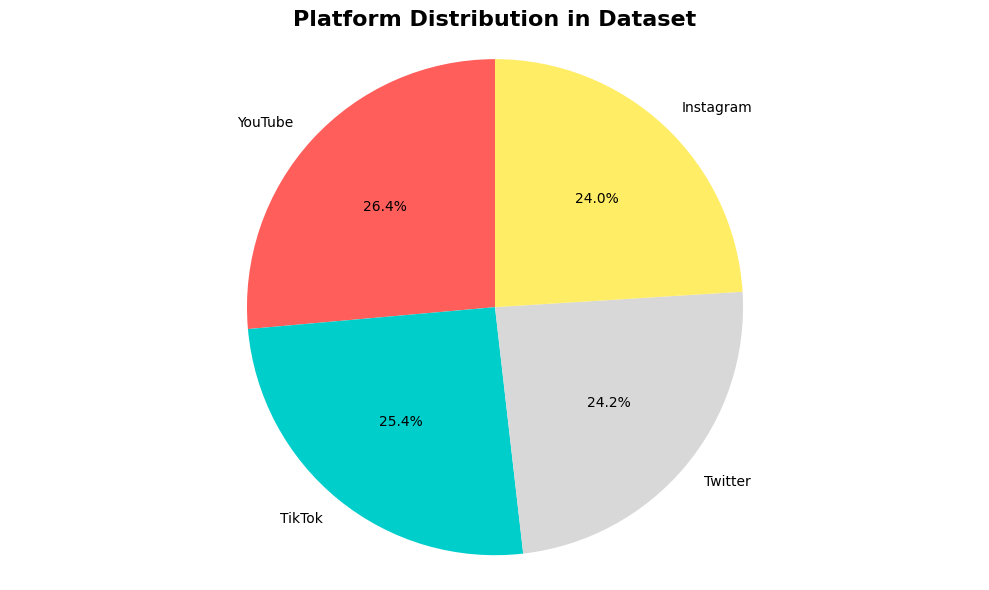

In [ ]:
# Platform Distribution
plt.figure(figsize=(10, 6))
platform_counts = df['Platform'].value_counts()
colors = ['#FF5E5B', '#00CECB', '#D8D8D8', '#FFED66']
plt.pie(platform_counts.values, labels=platform_counts.index, autopct='%1.1f%%',
        colors=colors, startangle=90)
plt.title('Platform Distribution in Dataset', fontsize=16, fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()

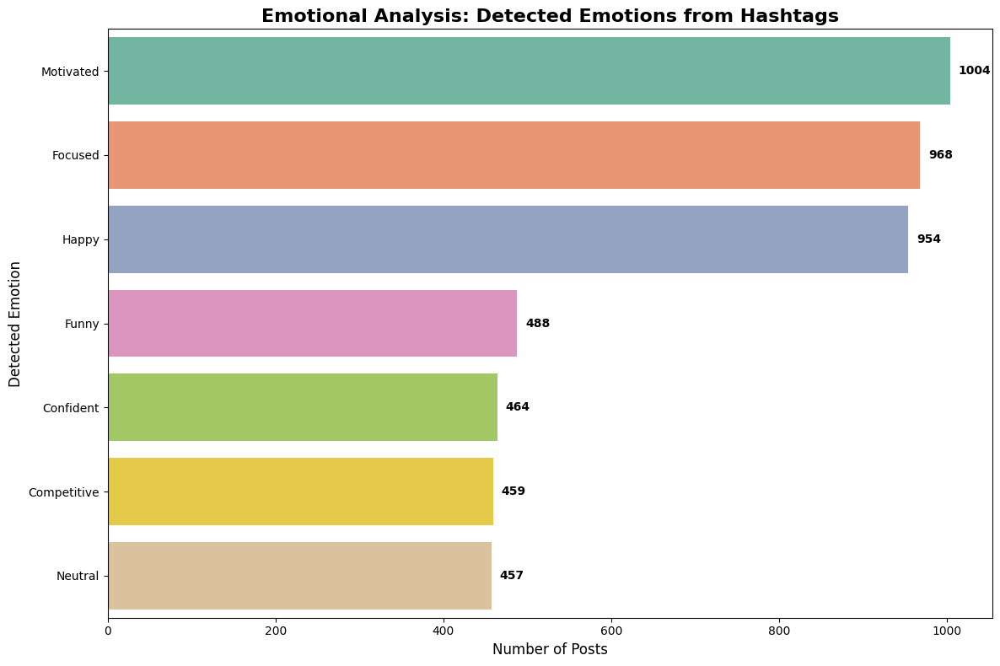

In [ ]:
plt.figure(figsize=(12, 8))
emotion_counts = df['Emotion'].value_counts()
sns.barplot(y=emotion_counts.index, x=emotion_counts.values, palette='Set2')
plt.title('Emotional Analysis: Detected Emotions from Hashtags', fontsize=16, fontweight='bold')
plt.xlabel('Number of Posts', fontsize=12)
plt.ylabel('Detected Emotion', fontsize=12)
for i, v in enumerate(emotion_counts.values):
    plt.text(v + 10, i, str(v), va='center', ha='left', fontweight='bold')
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Time Moment Distribution')

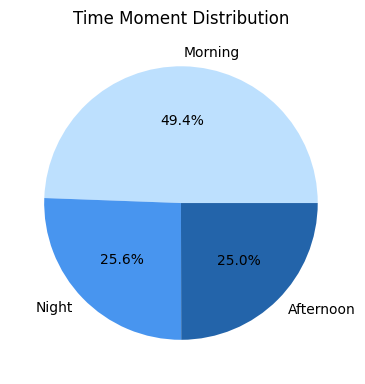

In [ ]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
time_counts = df['Time_Period'].value_counts()
plt.pie(time_counts.values, labels=time_counts.index, autopct='%1.1f%%',
        colors=['#bde0fe', '#4895ef', '#2364aa'])
plt.title('Time Moment Distribution')


In [ ]:
df.head()

,Platform,Hashtag,Content_Type,Region,Views,Likes,Shares,Comments,Engagement_Level,Engagement_Rate,Virality_Score,Comment_Rate,Like_Rate,Views_M,Likes_K,Emotion,Hour_Posted,Time_Period,Energy_Level,Temporal_Compatibility
0,Instagram,#Comedy,Tweet,Australia,2428341,178208,2717,10620,High,0.08,0.00,0.00,0.07,2.43,178.21,Funny,0,Morning,7,5
1,Twitter,#Viral,Reel,Brazil,4663539,21164,35101,32307,High,0.02,0.01,0.01,0.00,4.66,21.16,Neutral,17,Afternoon,4,5
2,Twitter,#Education,Live Stream,India,4863626,161724,81649,48891,Low,0.06,0.02,0.01,0.03,4.86,161.72,Focused,9,Morning,6,9
3,Instagram,#Fitness,Video,Australia,2463746,310242,10086,38862,High,0.15,0.00,0.02,0.13,2.46,310.24,Motivated,9,Morning,9,10
4,YouTube,#Tech,Reel,Brazil,3385451,448723,7234,43129,Low,0.15,0.00,0.01,0.13,3.39,448.72,Focused,18,Night,6,5


<Axes: xlabel='Likes', ylabel='Views'>

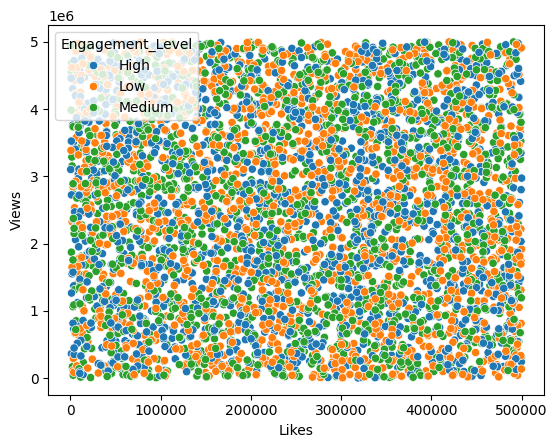

In [ ]:
sns.scatterplot(df,x = 'Likes',y = 'Views',hue ='Engagement_Level')

<Axes: ylabel='Shares'>

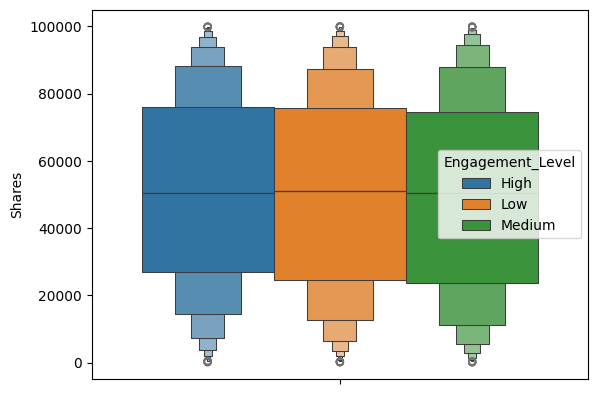

In [ ]:
sns.boxenplot(df,y = 'Shares', hue = 'Engagement_Level')

In [ ]:
# Preparar variables
y = df['Engagement_Level']
X = df[['Platform',  'Energy_Level', 'Emotion',]].copy()

# Codificar variables categóricas predictoras
label_encoders = {}
for col in ['Platform', 'Emotion']:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])
    label_encoders[col] = le

# Codificar variable objetivo
le_target = LabelEncoder()
y_encoded = le_target.fit_transform(y)

# División train-test
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)


# Definir modelo XGBoost
model_xgb = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=42,
    n_estimators=300,
    max_depth=8,
    learning_rate=0.01
)

# Entrenar modelo
model_xgb.fit(X_train, y_train)

# Predecir y evaluar
y_pred = model_xgb.predict(X_test)
print("Reporte de clasificación (XGBoost):")
print(classification_report(y_test, y_pred, target_names=le_target.classes_))

print("Matriz de confusión (XGBoost):")
print(confusion_matrix(y_test, y_pred))


Reporte de clasificación (XGBoost):
              precision    recall  f1-score   support

        High       0.36      0.41      0.38       319
         Low       0.33      0.23      0.27       320
      Medium       0.35      0.41      0.38       320

    accuracy                           0.35       959
   macro avg       0.35      0.35      0.34       959
weighted avg       0.35      0.35      0.34       959

Matriz de confusión (XGBoost):
[[130  74 115]
 [116  73 131]
 [113  76 131]]


Columnas eliminadas por correlación alta (> 0.90):
['Comment_Rate', 'Like_Rate', 'Views_M', 'Likes_K']


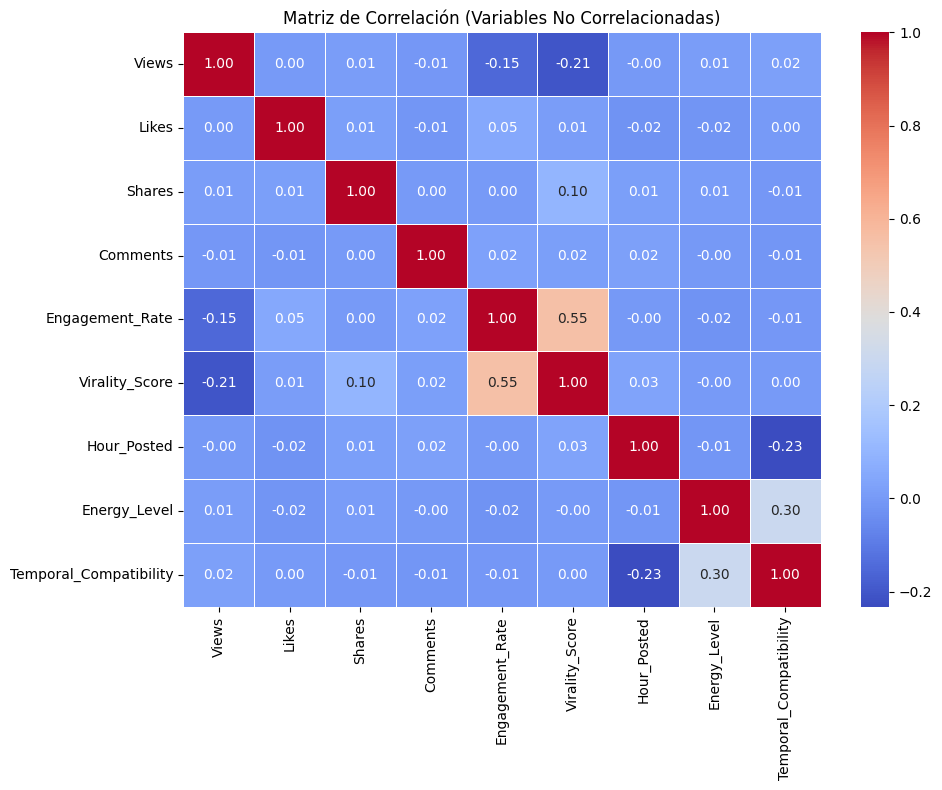

In [ ]:

# Paso 1: calcular la matriz de correlación
corr = df.corr(numeric_only=True)

# Paso 2: eliminar columnas con alta correlación
threshold = 0.9
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column].abs() > threshold)]

# df_cleaned contiene solo variables sin alta correlación
df_cleaned = df.drop(columns=to_drop)

print("Columnas eliminadas por correlación alta (> {:.2f}):".format(threshold))
print(to_drop)

# Paso 3: nueva matriz de correlación con variables no correlacionadas
corr_cleaned = df_cleaned.corr(numeric_only=True)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_cleaned, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Matriz de Correlación (Variables No Correlacionadas)")
plt.tight_layout()
plt.show()


Columnas eliminadas por correlación alta (> 0.90):
['Comment_Rate', 'Like_Rate', 'Views_M', 'Likes_K']


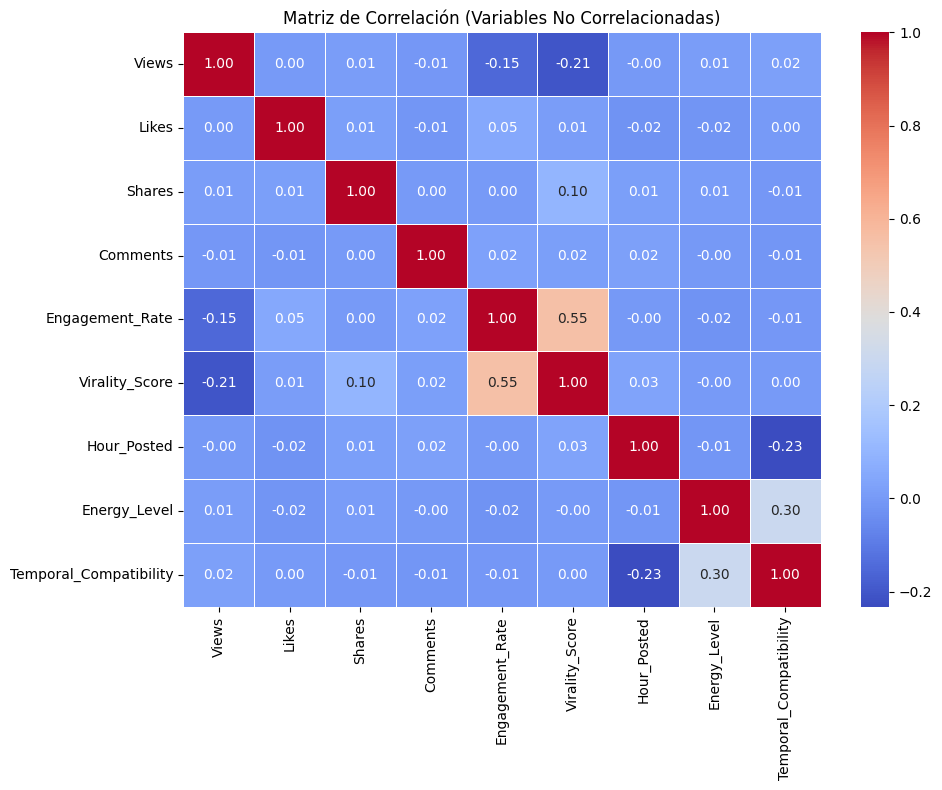

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1605
[LightGBM] [Info] Number of data points in the train set: 3835, number of used features: 15
[LightGBM] [Info] Start training from score -1.098091
[LightGBM] [Info] Start training from score -1.098873
[LightGBM] [Info] Start training from score -1.098873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

In [ ]:

corr = df.corr(numeric_only=True)

threshold = 0.9
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column].abs() > threshold)]

# df_cleaned contiene solo variables sin alta correlación
df_cleaned = df.drop(columns=to_drop)

print("Columnas eliminadas por correlación alta (> {:.2f}):".format(threshold))
print(to_drop)

corr_cleaned = df_cleaned.corr(numeric_only=True)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_cleaned, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Matriz de Correlación (Variables No Correlacionadas)")
plt.tight_layout()
plt.show()

# --- LGBMClassifier Model Training with Cleaned Data ---

# Prepare variables from the cleaned DataFrame
y = df_cleaned['Engagement_Level']
# Select features from df_cleaned that are not the target and are relevant
X = df_cleaned.drop(columns=['Engagement_Level'], errors='ignore') # Drop the target column

# Separate categorical and numerical columns for encoding
categorical_cols = X.select_dtypes(include='object').columns
numerical_cols = X.select_dtypes(include=np.number).columns

# Codificar variables categóricas predictoras
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])
    label_encoders[col] = le

# Codificar variable objetivo
le_target = LabelEncoder()
y_encoded = le_target.fit_transform(y)

# División train-test
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# Definir modelo LGBMClassifier
model_lgbm = lgb.LGBMClassifier(
    objective='multiclass', # For multi-class classification
    num_class=len(le_target.classes_), # Dynamically set num_class based on unique target values
    metric='multi_logloss', # Evaluation metric for multi-class
    random_state=42,
    n_estimators=300,
    max_depth=8,
    learning_rate=0.01
)

# Entrenar modelo
model_lgbm.fit(X_train, y_train)
# Predecir y evaluar
y_pred = model_lgbm.predict(X_test)
print("\nReporte de clasificación (LGBMClassifier):")
print(classification_report(y_test, y_pred, target_names=le_target.classes_))

print("\nMatriz de confusión (LGBMClassifier):")
print(confusion_matrix(y_test, y_pred))

In [ ]:
y = df['Engagement_Level']
X = df.drop(['Engagement_Level'], axis=1)

cat_cols = X.select_dtypes(include=['object']).columns
for col in cat_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])

le_y = LabelEncoder()
y = le_y.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(X_train, X_test, y_train, y_test)

models_sorted = models.sort_values("Accuracy", ascending=False)
print(models_sorted.head(10))  # Los 10 mejores modelos


  0%|          | 0/32 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2632
[LightGBM] [Info] Number of data points in the train set: 3835, number of used features: 19
[LightGBM] [Info] Start training from score -1.098091
[LightGBM] [Info] Start training from score -1.098873
[LightGBM] [Info] Start training from score -1.098873
                            Accuracy  Balanced Accuracy ROC AUC  F1 Score  \
Model                                                                       
LGBMClassifier                  0.37               0.37    None      0.37   
LinearSVC                       0.35               0.35    None      0.35   
RandomForestClassifier          0.35               0.35    None      0.35   
SVC                             0.35               0.35    None      0.35   
RidgeClassifierCV       

In [ ]:
df.Engagement_Level.value_counts()

,count
Engagement_Level,
High,1598
Low,1598
Medium,1598


In [ ]:

# Page configuration
st.set_page_config(
    page_title="📊 Viral Trend Analysis",
    page_icon="📊",
    layout="wide",
    initial_sidebar_state="expanded"
)

# Custom CSS styles
st.markdown("""
<style>
    .main { padding-top: 2rem; }
    .stMetric {
        background-color: #f0f2f6;
        border: 1px solid #e1e5e9;
        padding: 1rem;
        border-radius: 0.5rem;
        text-align: center;
    }
    .recommendation-card {
        background-color: #ffffff;
        border: 1px solid #e1e5e9;
        border-radius: 0.5rem;
        padding: 1rem;
        margin: 0.5rem 0;
        box-shadow: 0 2px 4px rgba(0,0,0,0.1);
    }
</style>
""", unsafe_allow_html=True)

@st.cache_data
def load_and_process_data():
    df = pd.read_csv("/content/sample_data/Viral_Social_Media_Trends.csv")
    df.columns = df.columns.str.strip().str.replace(" ", "_")
    if 'Post_ID' in df.columns:
        df = df.drop(['Post_ID'], axis=1)
    df['Engagement_Rate'] = (df['Likes'] + df['Shares'] + df['Comments']) / df['Views']
    df['Virality_Score'] = df['Shares'] / df['Views']
    df['Comment_Rate'] = df['Comments'] / df['Views']
    df['Like_Rate'] = df['Likes'] / df['Views']

    def detect_emotion(hashtag):
        hashtag = hashtag.lower()
        if any(word in hashtag for word in ['dance', 'music', 'party']): return 'Happy'
        elif any(word in hashtag for word in ['education', 'learn', 'tutorial', 'tech']): return 'Focused'
        elif any(word in hashtag for word in ['challenge', 'fitness', 'workout', 'motivation']): return 'Motivated'
        elif any(word in hashtag for word in ['comedy', 'funny', 'meme', 'lol']): return 'Funny'
        elif any(word in hashtag for word in ['travel', 'adventure', 'explore']): return 'Inspired'
        elif any(word in hashtag for word in ['food', 'cooking', 'recipe']): return 'Satisfied'
        elif any(word in hashtag for word in ['gaming', 'game', 'esports']): return 'Competitive'
        elif any(word in hashtag for word in ['beauty', 'fashion', 'style']): return 'Confident'
        else: return 'Neutral'
    df['Emotion'] = df['Hashtag'].apply(detect_emotion)

    np.random.seed(42)
    df['Hour_Posted'] = np.random.randint(0, 24, size=len(df))

    def classify_time_period(hour):
        if hour < 12: return 'Morning'
        elif hour < 18: return 'Afternoon'
        else: return 'Night'
    df['Time_Period'] = df['Hour_Posted'].apply(classify_time_period)

    emotional_energy = {
        'Motivated': 9, 'Competitive': 8, 'Happy': 8, 'Funny': 7,
        'Inspired': 7, 'Confident': 6, 'Focused': 6, 'Satisfied': 5,
        'Neutral': 4
    }
    df['Energy_Level'] = df['Emotion'].map(emotional_energy)

    def temporal_compatibility(time_period, emotion):
        matrix = {
            'Morning': {'Motivated': 10, 'Focused': 9, 'Inspired': 8, 'Happy': 6},
            'Afternoon': {'Happy': 10, 'Funny': 9, 'Satisfied': 8, 'Confident': 7},
            'Night': {'Neutral': 10, 'Funny': 8, 'Happy': 7, 'Competitive': 6}
        }
        return matrix.get(time_period, {}).get(emotion, 5)
    df['Temporal_Compatibility'] = df.apply(
        lambda row: temporal_compatibility(row['Time_Period'], row['Emotion']), axis=1
    )

    min_count = df['Engagement_Level'].value_counts().min()
    df_balanced = df.groupby('Engagement_Level').apply(
        lambda x: x.sample(min(min_count, len(x)), random_state=42)
    ).reset_index(drop=True)

    return df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

@st.cache_data
def train_model(df):
    y = df['Engagement_Level']
    X = df[['Platform', 'Energy_Level', 'Emotion']].copy()
    label_encoders = {}
    for col in ['Platform', 'Emotion']:
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])
        label_encoders[col] = le
    le_target = LabelEncoder()
    y_encoded = le_target.fit_transform(y)
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

    model = LGBMClassifier(objective='multiclass', num_class=3, random_state=42, n_estimators=100, max_depth=6, learning_rate=0.1, verbose=-1)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    matrix = confusion_matrix(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=le_target.classes_)

    return model, label_encoders, le_target, accuracy, matrix, report

# Recommendation function
def recommend_content(df, emotion, time_period, platform, num_recommendations):
    filtered_df = df[
        (df['Emotion'] == emotion) &
        (df['Time_Period'] == time_period) &
        (df['Platform'] == platform)
    ].copy()
    if filtered_df.empty:
        return pd.DataFrame()
    filtered_df['Recommendation_Score'] = (
        0.5 * filtered_df['Engagement_Rate'] +
        0.3 * filtered_df['Temporal_Compatibility'] / 10 +
        0.2 * filtered_df['Energy_Level'] / 10
    )
    return filtered_df.sort_values(by='Recommendation_Score', ascending=False).head(num_recommendations)

# Sidebar
st.sidebar.header("🎯 Configuration")
page = st.sidebar.selectbox(
    "Select a page:",
    ["📈 Main Dashboard", "🤖 Model Training", "💡 Content Recommendations"]
)

# Load data and model if needed
if page in ["📈 Main Dashboard", "💡 Content Recommendations"]:
    df = load_and_process_data()
    model, label_encoders, le_target, model_accuracy, cm, report = train_model(df)

# Pages
if page == "📈 Main Dashboard":
    st.header("Main Dashboard")
    col1, col2, col3, col4 = st.columns(4)
    with col1: st.metric("📊 Total Posts", f"{len(df):,}")
    with col2: st.metric("📱 Average Engagement", f"{df['Engagement_Rate'].mean():.3f}")
    with col3: st.metric("🎯 Model Accuracy", f"{model_accuracy:.2%}")
    with col4: st.metric("🏆 Top Platform", df['Platform'].value_counts().idxmax())

    st.markdown("---")
    col1, col2 = st.columns(2)
    with col1:
        st.subheader("📱 Platform Distribution")
        fig = px.pie(values=df['Platform'].value_counts(), names=df['Platform'].value_counts().index)
        st.plotly_chart(fig, use_container_width=True)
    with col2:
        st.subheader("😊 Emotion Distribution")
        fig = px.bar(x=df['Emotion'].value_counts().values, y=df['Emotion'].value_counts().index, orientation='h')
        st.plotly_chart(fig, use_container_width=True)

    st.subheader("📊 Engagement Analysis")
    col1, col2 = st.columns(2)
    with col1:
        fig = px.scatter(df, x='Likes', y='Views', color='Engagement_Level', size='Shares')
        st.plotly_chart(fig, use_container_width=True)
    with col2:
        fig = px.box(df, y='Shares', color='Engagement_Level')
        st.plotly_chart(fig, use_container_width=True)

elif page == "🤖 Model Training":
    st.header("Model Training")
    df = load_and_process_data()
    model, label_encoders, le_target, acc, cm, report = train_model(df)
    st.metric("Accuracy", f"{acc:.2%}")
    fig, ax = plt.subplots()
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le_target.classes_, yticklabels=le_target.classes_, ax=ax)
    st.pyplot(fig)
    st.text(report)

elif page == "💡 Content Recommendations":
    st.header("Content Recommendation System")
    col1, col2, col3 = st.columns(3)
    with col1:
        user_platform = st.selectbox("📱 Your Platform:", options=df['Platform'].unique())
    with col2:
        user_emotion = st.selectbox("😊 Your Mood:", options=df['Emotion'].unique())
    with col3:
        user_time = st.selectbox("🕐 Time of Day:", options=df['Time_Period'].unique())
    num_recommendations = st.slider("📊 Number of Recommendations:", min_value=3, max_value=10, value=5)
    if st.button("🔍 Get Recommendations", type="primary"):
        results = recommend_content(df, user_emotion, user_time, user_platform, num_recommendations)
        if not results.empty:
            st.success(f"🎉 {len(results)} recommendations found")
            for _, row in results.iterrows():
                st.markdown(f"""
                <div class="recommendation-card">
                    <h4>🏷️ {row['Hashtag']}</h4>
                    <p>👁️ {row['Views']:,} | ❤️ {row['Likes']:,} | 🔄 {row['Shares']:,}</p>
                    <p>📊 Engagement: {row['Engagement_Rate']:.3f} | ⭐ Score: {row['Recommendation_Score']:.2f}</p>
                </div>
                """, unsafe_allow_html=True)
        else:
            st.warning("No recommendations found for those criteria.")

st.markdown("---")
st.markdown("<div style='text-align:center;color:#888;'>📊 Final Project - Data Science</div>", unsafe_allow_html=True)


2025-05-28 00:52:25.026 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-28 00:52:25.030 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-28 00:52:25.034 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-28 00:52:25.038 No runtime found, using MemoryCacheStorageManager
2025-05-28 00:52:25.046 No runtime found, using MemoryCacheStorageManager
2025-05-28 00:52:25.050 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-28 00:52:25.052 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-28 00:52:25.054 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-28 00:52:25.055 Thread 'MainThread': missing ScriptRunContext! This warning can be ignor

DeltaGenerator()

# **SHAP Y LIME**


------------------------------------------------------------------------------
**NOTAS**


Estamos haciendo SHAP y LIME a cada uno de los los 10 modelos que nos da LazyClassifier, aproximadamente tarda 5 minutos

------------------------------------------------------------------------------



=== Modelo: LGBMClassifier ===
  → Ejecutando SHAP...


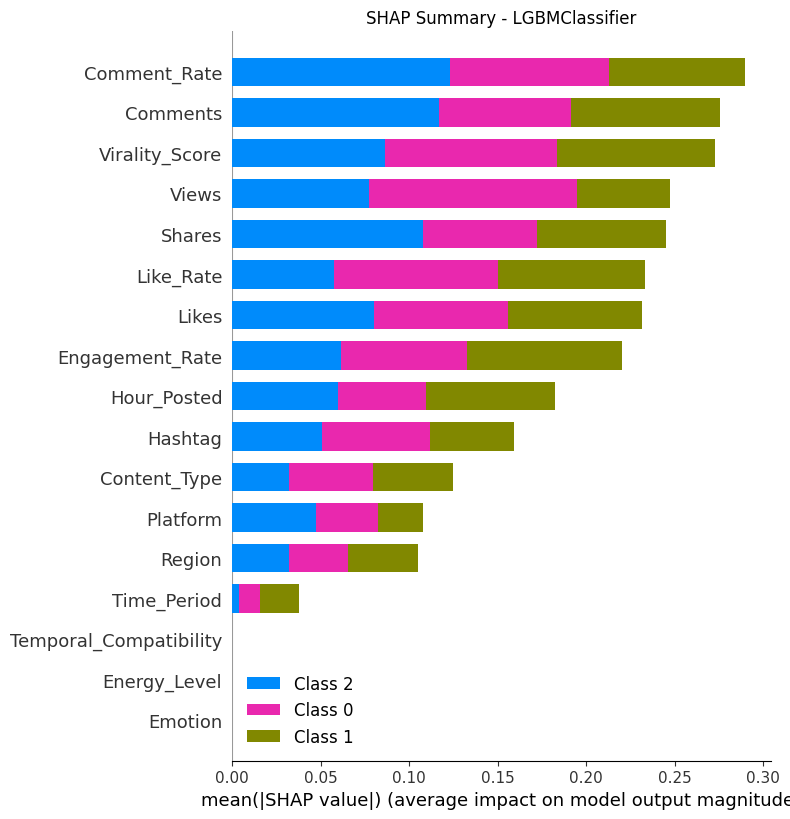

  [SHAP Error] LGBMClassifier: only length-1 arrays can be converted to Python scalars
  → Ejecutando LIME...



=== Modelo: LinearSVC ===
  [Skip SHAP] LinearSVC no es compatible con SHAP o no tiene predict_proba.
  [Skip LIME] LinearSVC no tiene predict_proba.

=== Modelo: RandomForestClassifier ===
  → Ejecutando SHAP...


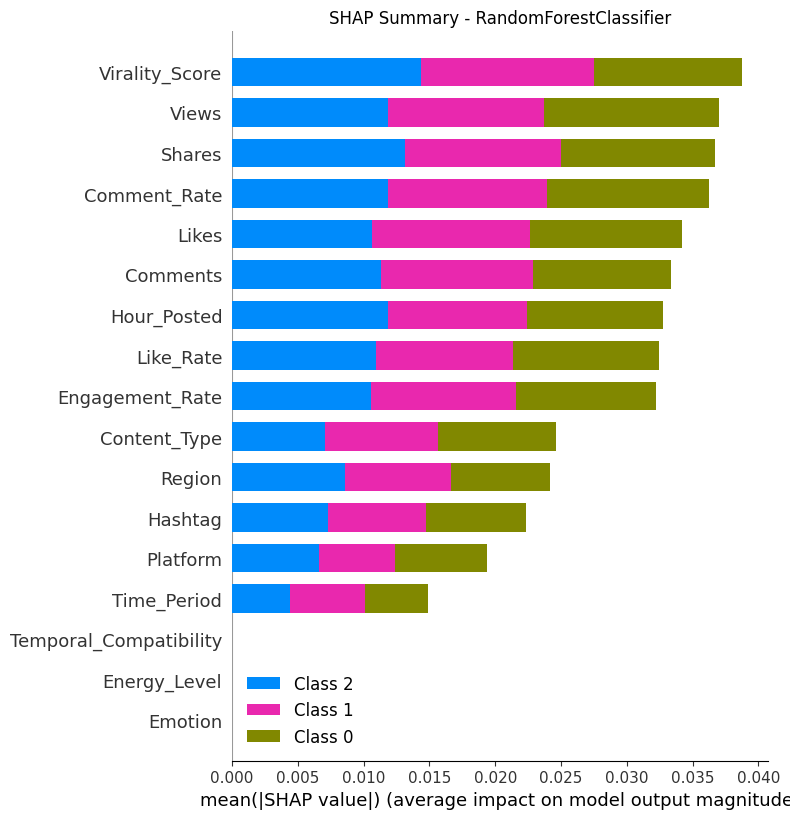

  [SHAP Error] RandomForestClassifier: only length-1 arrays can be converted to Python scalars
  → Ejecutando LIME...



=== Modelo: SVC ===
  [Skip SHAP] SVC no es compatible con SHAP o no tiene predict_proba.
  → Ejecutando LIME...



=== Modelo: RidgeClassifierCV ===
  [Skip SHAP] RidgeClassifierCV no es compatible con SHAP o no tiene predict_proba.
  [Skip LIME] RidgeClassifierCV no tiene predict_proba.

=== Modelo: XGBClassifier ===
  → Ejecutando SHAP...


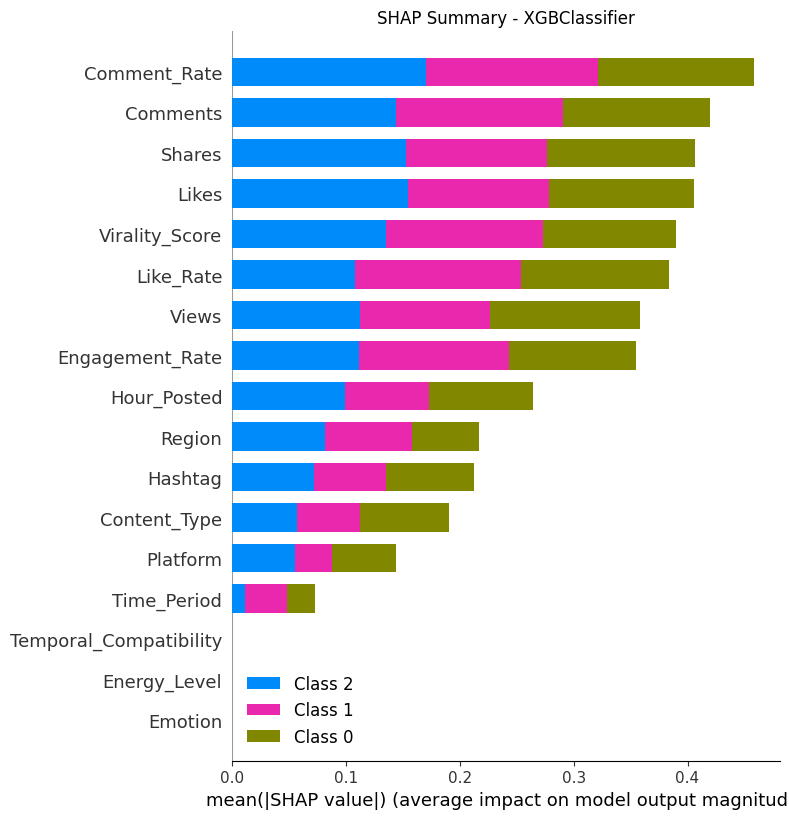

  [SHAP Error] XGBClassifier: only length-1 arrays can be converted to Python scalars
  → Ejecutando LIME...



=== Modelo: LinearDiscriminantAnalysis ===
  → Ejecutando SHAP...


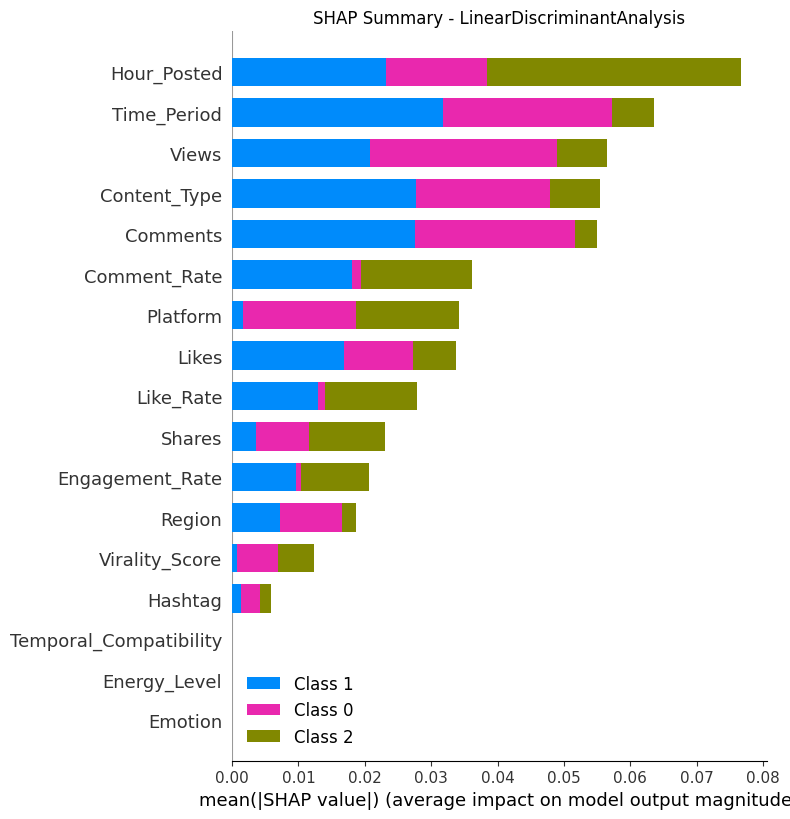

  [SHAP Error] LinearDiscriminantAnalysis: only length-1 arrays can be converted to Python scalars
  → Ejecutando LIME...



=== Modelo: RidgeClassifier ===
  [Skip SHAP] RidgeClassifier no es compatible con SHAP o no tiene predict_proba.
  [Skip LIME] RidgeClassifier no tiene predict_proba.

=== Modelo: LogisticRegression ===
  → Ejecutando SHAP...


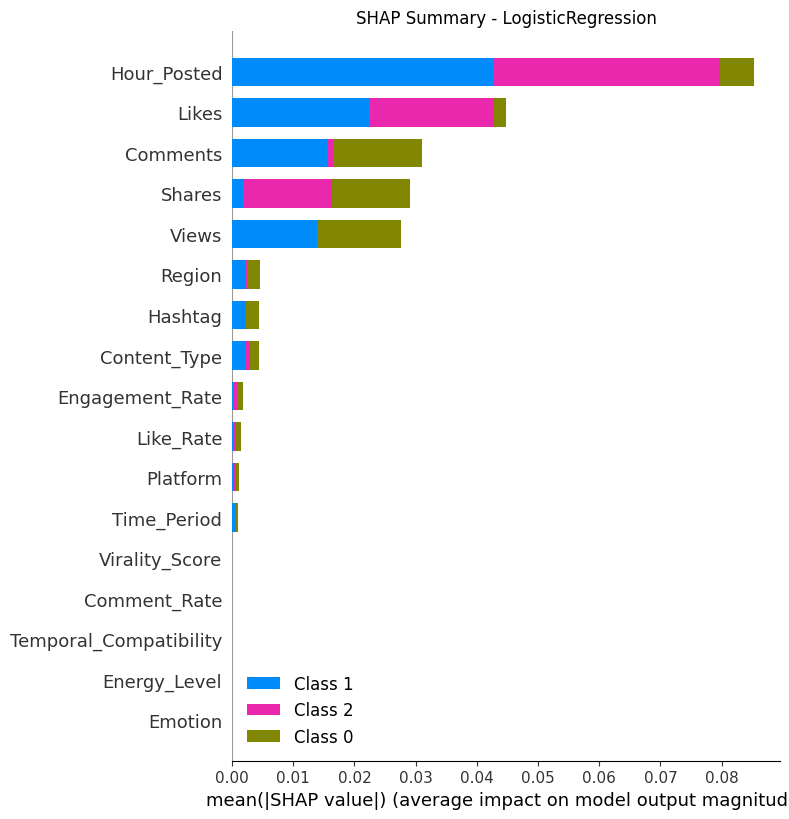

  [SHAP Error] LogisticRegression: only length-1 arrays can be converted to Python scalars
  → Ejecutando LIME...



=== Modelo: ExtraTreeClassifier ===
  → Ejecutando SHAP...


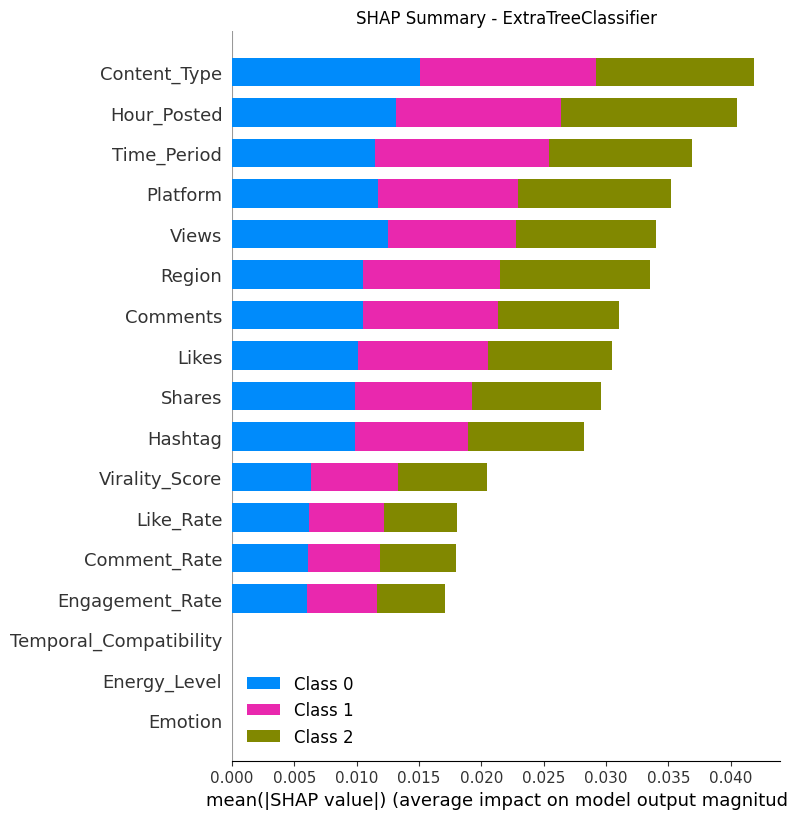

  [SHAP Error] ExtraTreeClassifier: only length-1 arrays can be converted to Python scalars
  → Ejecutando LIME...


In [128]:
# Modelos - Prueba Manual
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, RidgeClassifierCV
from sklearn.svm import SVC, LinearSVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier



# Feature engineering
#df['Emotion'] = df['Hashtag'].apply(lambda h: 'Happy' if 'party' in h.lower() else 'Neutral')
#emotional_energy = {'Happy': 8, 'Neutral': 4}
#df['Energy_Level'] = df['Emotion'].map(emotional_energy)
#df['Temporal_Compatibility'] = 5

# =====================  Modelos =====================
model_dict = {
    'LGBMClassifier': LGBMClassifier(random_state=42),
    'LinearSVC': LinearSVC(),
    'RandomForestClassifier': RandomForestClassifier(random_state=42),
    'SVC': SVC(probability=True),
    'RidgeClassifierCV': RidgeClassifierCV(),
    'XGBClassifier': XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42),
    'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis(),
    'RidgeClassifier': RidgeClassifier(),
    'LogisticRegression': LogisticRegression(max_iter=1000),
    'ExtraTreeClassifier': ExtraTreesClassifier(random_state=42)
}

# =====================  LIME Explainer =====================
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=le_y.classes_.tolist(),
    mode='classification'
)

# =====================  Interpretación =====================
def interpret_model(model_name, model):
    print(f"\n=== Modelo: {model_name} ===")
    model.fit(X_train, y_train)

    # Verificar si el modelo soporta predict_proba
    supports_proba = hasattr(model, "predict_proba")

    # Modelos no compatibles con SHAP directo
    shap_incompatible_models = ["SVC", "LinearSVC"]

    # --- SHAP ---
    if supports_proba and model_name not in shap_incompatible_models:
        try:
            print("  → Ejecutando SHAP...")

            # Usar TreeExplainer si aplica
            if model_name in ["RandomForestClassifier", "ExtraTreeClassifier", "XGBClassifier", "LGBMClassifier"]:
                shap_explainer = shap.TreeExplainer(model)
            else:
                shap_explainer = shap.Explainer(model, X_train)

            shap_values = shap_explainer(X_test)

            # Resumen general
            shap.summary_plot(shap_values, X_test, show=False)
            plt.title(f"SHAP Summary - {model_name}")
            plt.tight_layout()
            plt.show()

            # Waterfall para una observación
            sample_idx = 0
            pred_probs = model.predict_proba(X_test)

            if isinstance(pred_probs, list):
                pred_probs = np.array(pred_probs)

            if len(pred_probs.shape) == 2 and pred_probs.shape[1] > 1:
                class_idx = np.argmax(pred_probs[sample_idx])
                shap.plots.waterfall(shap_values[sample_idx][class_idx])
            else:
                shap.plots.waterfall(shap_values[sample_idx])

        except Exception as e:
            print(f"  [SHAP Error] {model_name}: {e}")
    else:
        print(f"  [Skip SHAP] {model_name} no es compatible con SHAP o no tiene predict_proba.")

    # --- LIME ---
    if supports_proba:
        try:
            print("  → Ejecutando LIME...")
            explanation = explainer_lime.explain_instance(
                data_row=X_test.iloc[0].values,
                predict_fn=model.predict_proba,
                num_features=5
            )
            explanation.show_in_notebook()
        except Exception as e:
            print(f"  [LIME Error] {model_name}: {e}")
    else:
        print(f"  [Skip LIME] {model_name} no tiene predict_proba.")


# ===================== 6. Ejecutar interpretación por modelo =====================
for name, model in model_dict.items():
    interpret_model(name, model)
